In [ ]:
pip install geopandas

In [1]:
# Import packages required for the project
import numpy as np
import pandas as pd
import folium
import geopandas as gpd
pd.options.mode.chained_assignment = None
import warnings
from matplotlib.cbook import boxplot_stats
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import requests
from PIL import Image



%matplotlib inline
from folium import plugins
import locale
from folium.plugins import HeatMap
warnings.filterwarnings('ignore')

In [2]:
# Residential property transaction data of Hong Kong Island from 2015 to 2020
df = pd.read_excel('(data)Real_Estate_Analytics.xlsx')


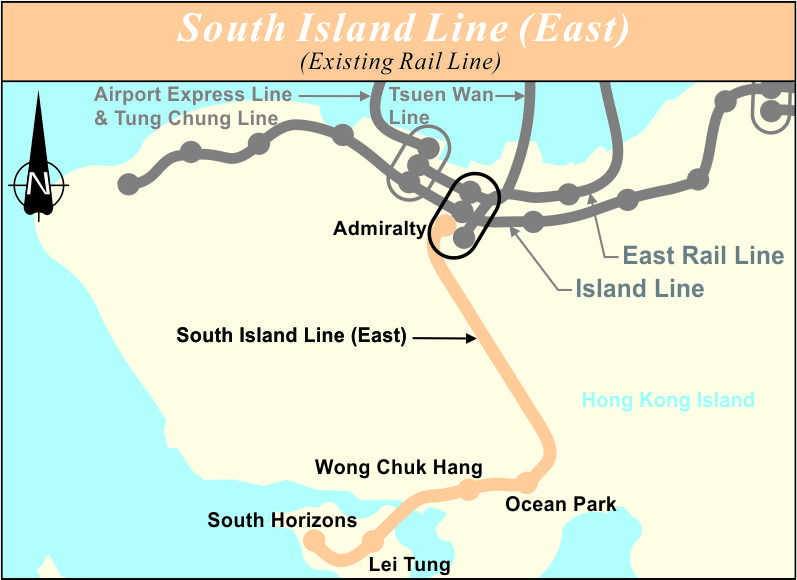

In [3]:
# 图片URL
url = "https://www.hyd.gov.hk/en/road_and_railway/railway_network/sile/images/popup.jpg"

response = requests.get(url, stream=True)
img = Image.open(response.raw).convert("RGB")
img

In [4]:
# Select subset of data including only 2015
df_2015 = df.loc[df['year'] == 2015]

# Create a subset of the data including the following columns: 'district','DISTRICT', 'Price_ft__Net_'
df_2015 = df_2015[['district','DISTRICT', 'Price_ft__Net_']].copy()

# Select records with non-NaN values in the 'Price_ft__Net_' column
df_2015 = df_2015[~df_2015['Price_ft__Net_'].isna()]


# Create a dataset with average values for 'Price_ft__Net_' columns grouped by 'DISTRICT'
aggregate_data1 = (df_2015.groupby('DISTRICT')['Price_ft__Net_'].mean()).reset_index()

In [6]:
# Load district boundaries data from a geojson (gj) file
gj_df = gpd.read_file('Hong_Kong_18_Districts.geojson')

# Rename the District Name field in the Geopandas DataFrame from ENAME to 'District'
# Make it consistent with aggregate_data column name
gj_df = gj_df.rename(columns={"ENAME": "DISTRICT"})

# Merge it with aggregate_data to combine district boundaries and pricing data
gj_df = gj_df.merge(aggregate_data1, on='DISTRICT', how='left')

# Sort the dataset by per-square-foot prices
gj_df = gj_df.sort_values(by='Price_ft__Net_', ascending=True)

In [7]:
# Create a Choropleth Map

districts_json = "Hong_Kong_18_Districts.geojson"

m = folium.Map(location=[22.2590039,114.1693611], zoom_start=12)

folium.Choropleth(
    geo_data=gj_df,
    name="choropleth",
    data=aggregate_data1,
    columns=["DISTRICT", "Price_ft__Net_"],
    key_on="feature.properties.DISTRICT",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Price per Square Foot (HKD, $)",
).add_to(m)

style_function = lambda x: {'fillColor': '#ffffff',
                            'color':'#000000',
                            'fillOpacity': 0.1,
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000',
                                'color':'#000000',
                                'fillOpacity': 0.50,
                                'weight': 0.1}
  


info = folium.features.GeoJson(
   gj_df,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['DISTRICT', 'Price_ft__Net_'],
        aliases=['DISTRICT: ', 'Average Price per Square Foot: '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
    )
)
m.add_child(info)
m.keep_in_front(info)

#folium.LayerControl().add_to(m)
m




In [8]:
# Select subset of data including only 2017
df_2017 = df.loc[df['year'] == 2017]

# Create a subset of the data including the following columns: 'district','DISTRICT', 'Price_ft__Net_'
df_2017 = df_2017[['district','DISTRICT', 'Price_ft__Net_']].copy()

# Select records with non-NaN values in the 'Price_ft__Net_' column
df_2017 = df_2017[~df_2017['Price_ft__Net_'].isna()]




# Select subset of data including only 2015
df_2015 = df.loc[df['year'] == 2015]

# Create a subset of the data including the following columns: 'district','DISTRICT', 'Price_ft__Net_'
df_2015 = df_2015[['district','DISTRICT', 'Price_ft__Net_']].copy()

# Select records with non-NaN values in the 'Price_ft__Net_' column
df_2015 = df_2015[~df_2015['Price_ft__Net_'].isna()]


aggregate_data_2015 = (df_2015.groupby('DISTRICT')['Price_ft__Net_'].mean()).reset_index()
aggregate_data_2017 = (df_2017.groupby('DISTRICT')['Price_ft__Net_'].mean()).reset_index()
aggregate_data_2015


,DISTRICT,Price_ft__Net_
0,CENTRAL & WESTERN,19966.582383
1,EASTERN,13240.125583
2,SOUTHERN,16148.953501
3,WAN CHAI,22592.162156


In [9]:
aggregate_data_2017

,DISTRICT,Price_ft__Net_
0,CENTRAL & WESTERN,22553.128193
1,EASTERN,17835.543035
2,SOUTHERN,17360.853808
3,WAN CHAI,21801.597436


In [10]:


heat_data = [[row['latitude'],row['longitude']] for index, row in df.iterrows()]
map = folium.Map(location=[22.2753039,114.1403611], zoom_start = 14)

# Plot it on the map
HeatMap(heat_data).add_to(map)

# Display the map
map

In [11]:
# Select subset of data including only 2015
df_2015 = df.loc[df['year'] == 2015]

# Create a subset of the data including the following columns: 'district','DISTRICT', 'Price_ft__Net_'
df_2015 = df_2015[['district','DISTRICT', 'Price_ft__Net_']].copy()


aggregate_data0 = (df_2015.groupby('district')['Price_ft__Net_'].mean()).reset_index()


# Select subset of data including only 2017
df_2017 = df.loc[df['year'] == 2017]

# Create a subset of the data including the following columns: 'district','DISTRICT', 'Price_ft__Net_'
df_2017 = df_2017[['district','DISTRICT', 'Price_ft__Net_']].copy()




aggregate_data1 = (df_2017.groupby('district')['Price_ft__Net_'].mean()).reset_index()


aggregate_data_dif = aggregate_data1
aggregate_data_dif['Price Fluctuation'] = ((aggregate_data1['Price_ft__Net_']-aggregate_data0['Price_ft__Net_'])/aggregate_data0['Price_ft__Net_'])
aggregate_data_dif = aggregate_data_dif.sort_values(by='Price Fluctuation', ascending=True)
aggregate_data_dif 

,district,Price_ft__Net_,Price Fluctuation
17,STANLEY,18220.400000,-0.509003
7,MID-LEVELS EAST,20325.036957,-0.218895
9,NORTH POINT HILL,18305.775000,-0.072544
18,WAN CHAI,21000.180000,-0.027293
5,MID-LEVEL WEST,22488.217791,0.001160
13,SAI YING PUN,21322.032719,0.047076
1,CAUSEWAY BAY,21773.358025,0.047127
2,CHAI WAN,12065.746512,0.063201
10,POKFULAM,17957.330052,0.072989
0,ABERDEEN/AP LEI CHAU,15955.562821,0.075274


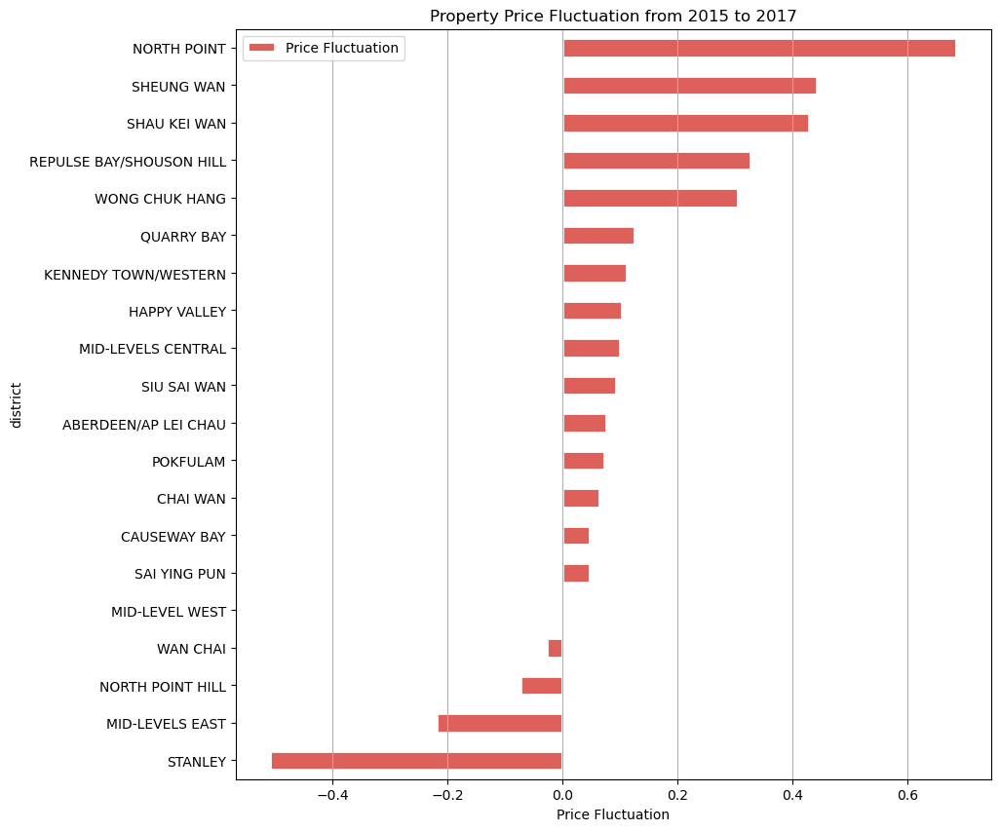

In [12]:
# Create a Horizontal Bar Chart with per-square-foot prices by district (descending order)

aggregate_data_dif .plot.barh(x='district', y='Price Fluctuation', title='Property Price Fluctuation from 2015 to 2017', figsize=(10,10), color='#de605b', edgecolor="white", linewidth=2)

plt.grid(which="major", axis='x', zorder=-1.0)
plt.rcParams['axes.facecolor']='lightgrey'
plt.xlabel('Price Fluctuation')
plt.show()